In [10]:
import numpy as np
from algorithms import profile_likelihood

labels = np.array([0, 0, 1, 1, 2, 2, 3, 3, 3])

a = np.array([[1, 10], [3, 4]])
a.size

4

0.5624007724664295 [0 1 1 0 1 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 1 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 0
 0 1 0 0 0 0 1 0 0 1 1 0 0] [1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 1 0 1 0 0 0 0 1
 0 0 1 0 1 0 0 0 0 1 0 0 1]
0.3640914633185731 [0 1 1 0 1 1 1 1 0 0 1 1 0 1 0 0 1 0 1 0 1 0 0 1 0 1 0 1 0 1 0 0 1 1 0 0 0
 1 1 1 1 0 0 0 0 1 0 0 0 0] [0 1 1 0 0 1 0 1 1 1 0 0 0 0 1 0 0 1 1 1 0 1 0 1 1 0 1 0 0 0 1 1 0 1 0 1 1
 1 0 1 1 1 0 1 0 1 1 0 1 1]
0.36393385450412385 [0 1 0 1 1 1 1 1 1 1 0 1 1 0 1 0 0 0 0 1 0 1 1 0 0 1 0 1 0 0 1 1 1 0 0 0 1
 0 1 1 0 0 1 1 1 0 1 1 0 1] [1 1 0 1 1 0 0 1 1 1 1 0 0 1 0 0 0 0 1 0 0 1 1 1 1 0 1 1 0 1 0 1 0 1 1 1 0
 1 1 1 0 0 0 0 0 1 1 0 0 1]
0.36718968870172103 [0 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 0 1 1 1 1 0 0 0 0 1 1 0 1 1 1 0 1 1 1 1 0
 0 0 0 1 1 1 0 1 0 0 0 0 1] [1 1 0 1 0 1 1 0 1 1 1 1 0 0 0 1 1 1 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 1 0 1 0
 1 1 0 0 0 1 1 1 1 0 1 0 0]
0.3902100380159852 [1 0 0 1 0 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 0 1 0 1 1 1 1 0 1
 1 1

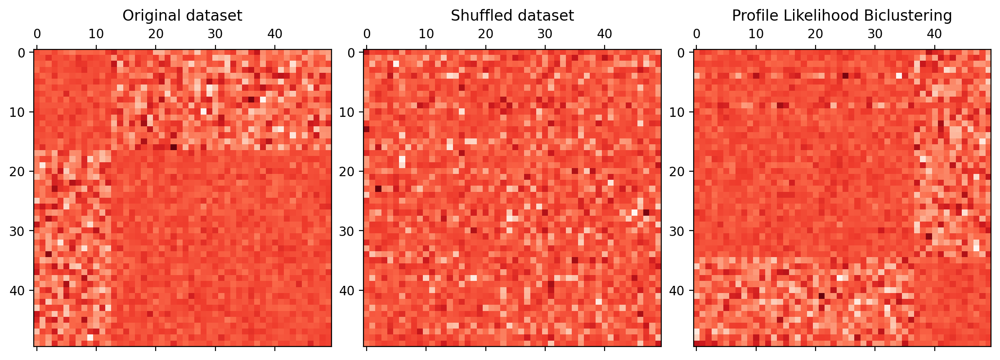

In [8]:
import numpy as np
from matplotlib import pyplot as plt
from algorithms import profile_likelihood
from generate import make_biclusters_simulation
from typing import Tuple
from sklearn.metrics import consensus_score
from utils import run_n_times, get_biclusters_from_labels

def show(shape: Tuple[int, int], n_clusters: int, n_runs: int):
    fig, (ax1, ax2, ax3) = plt.subplots(
        1, 3, figsize=(11, 4), layout='constrained', dpi=200)

    # generate data matrix with cluster assignments
    # data, rows, cols = make_biclusters(
    #     shape=shape, n_clusters=n_clusters, noise=noise, shuffle=False)

    data, rows, cols = make_biclusters_simulation(
        shape=shape,
        M=np.array([[1., 0], [0, 1.]]),
        S=np.array([[.7, 1.3], [1.3, .7]]),
        n_clusters=2,
        sizes=np.array([.3, .7])
    )

    # b = .5
    # data, rows, cols = make_biclusters_simulation(
    #     shape=shape,
    #     M=b * np.array([[.36, .90], [-.58, -.06]]),
    #     S=np.array([[1. + b, 1.], [1., 1. + b]]),
    #     n_clusters=2,
    #     sizes=np.array([.3, .7])
    # )

    # show original dataset with visible clusters
    ax1.matshow(data, cmap=plt.cm.Reds)
    ax1.set_title("Original dataset")

    # shuffle data
    rng = np.random.RandomState(0)
    row_idx = rng.permutation(data.shape[0])
    col_idx = rng.permutation(data.shape[1])
    data = data[row_idx][:, col_idx]

    # show shuffled data
    ax2.matshow(data, cmap=plt.cm.Reds)
    ax2.set_title("Shuffled dataset")


    row_labels, col_labels = run_n_times(
        algorithm=profile_likelihood.profile_likelihood_biclustering,
        args={
            "data_matrix": data,
            "n_clusters": 2,
        },
        n_runs=n_runs
    )

    # reorder rows and cols of a data matrix to show clusters
    fit_data = data[np.argsort(row_labels)]
    fit_data = fit_data[:, np.argsort(col_labels)]

    # show data matrix with reordered rows and cols according to calculated cluster assignments
    ax3.matshow(fit_data, cmap=plt.cm.Reds)
    ax3.set_title(f"Profile Likelihood Biclustering")

    # calculate consensus score between expected and actual biclusters
    score = consensus_score(get_biclusters_from_labels(shape, n_clusters, row_labels, col_labels),
                            (rows[:, row_idx], cols[:, col_idx]))

    print(f"Consensus Score: {score:.3f}")

    plt.show()

show(
    shape=(50, 50),
    n_clusters=3,
    n_runs=5
)

In [27]:
from typing import Literal

# class Assignment:
#     def __init__(self, type: Literal['row', 'col', 'blank'], to_cluster_idx: int = 0, criterion_eval: float = 0.):
#         self.type = type
#         self.to_cluster_idx = to_cluster_idx
#         self.criterion_eval = criterion_eval

dtype = [('type', 'S3'), ('to_cluster_idx', int), ('criterion_eval', float)]

assignment_list = []
for i in range(10):
    assignment_list.append(('row' if np.random.rand() > 0.5 else 'col', 4, np.random.rand() * 10))

a = np.array(assignment_list, dtype=dtype)

np.flip(np.sort(a, order=['criterion_eval'], kind='quicksort'))

array([(b'col', 4, 9.923504  ), (b'row', 4, 9.21143958),
       (b'col', 4, 7.45528679), (b'col', 4, 7.41545618),
       (b'row', 4, 7.03102218), (b'col', 4, 6.43622863),
       (b'row', 4, 4.8894104 ), (b'col', 4, 3.33544315),
       (b'row', 4, 3.15979296), (b'row', 4, 1.56915038)],
      dtype=[('type', 'S3'), ('to_cluster_idx', '<i4'), ('criterion_eval', '<f8')])

In [1]:
def f():
    return 1,2,3,4

a, b, c = f()

ValueError: too many values to unpack (expected 3)

In [9]:
%%time
for i in range(int(1e8)):
    continue

CPU times: user 3.75 s, sys: 0 ns, total: 3.75 s
Wall time: 3.76 s


In [10]:
%%time
for i in np.nditer(np.arange(int(1e8))):
    continue

CPU times: user 7.33 s, sys: 525 ms, total: 7.86 s
Wall time: 7.86 s


In [22]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from sklearn.datasets import make_biclusters, make_checkerboard
from sklearn.cluster import SpectralCoclustering
from sklearn.metrics import consensus_score

from tqdm import trange

from typing import Literal, Tuple, Callable, Dict
from numpy.typing import NDArray

from utils import get_biclusters_from_labels
from generate import make_checkerboard_with_custom_distribution, Distribution


### Types of Data-Matrices

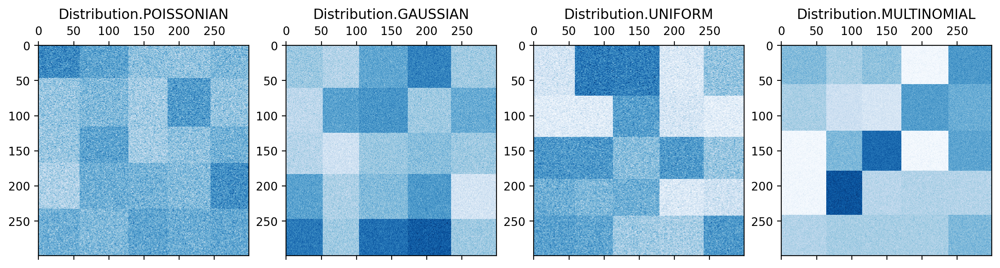

In [23]:
shape = (300, 300)
n_clusters = 5
noise = 10

fig, axes = plt.subplots(1, 4, figsize=(12, 7), layout='constrained', dpi=200)

data_matrices = []

for d in Distribution:
    data, _, _ = make_checkerboard_with_custom_distribution(
        shape=shape, n_clusters=n_clusters, noise=noise, distribution=d)
    data_matrices.append(data)

for d, i in zip(Distribution, range(len(Distribution))):
    axes[i].matshow(data_matrices[i], cmap=plt.cm.Blues)
    axes[i].set_title(f"{d}")

plt.show()


### Algorithms

In [27]:
def biclustering_wrapper(
    X: NDArray,
    n_clusters: int,
    type: Literal['biclusters', 'checkerboard'],
    metric_name: Literal['euclidian', 'kullback-leibler'],
    EM: Callable,
    *,
    repeat=15,
    verbose=True
) -> tuple[NDArray, NDArray]:
    
    n_rows = X.shape[0]
    n_cols = X.shape[1]

    # calculate weigths as 1 / sigma, where sigma is standard deviation from col mean values
    w = 1. / np.array([np.sqrt(np.sum(np.square(X.T[j] - np.mean(X.T[j]))) / (n_rows - 1)) for j in range(n_cols)])

    def d_euc(x: NDArray, y: NDArray) -> float:
        return np.mean(np.square(x - y) * w)

    def d_kl(x: NDArray, y: NDArray) -> float:
        p = x
        q = y
        return np.sum(p * np.log(p / q)) - np.sum(p) + np.sum(q)

    if metric_name == "euclidian":
        metric = d_euc
    elif metric_name == "kullback-leibler":
        metric = d_kl

    min_row_loss, final_row_labels = EM(X, n_clusters, metric)

    if verbose:
        row_trange = trange(
            repeat-1, desc=f'Row Loss: {min_row_loss:.3f}', leave=True)
    else:
        row_trange = range(repeat-1)

    for _ in row_trange:

        row_loss, row_labels = EM(X, n_clusters, metric)

        if row_loss < min_row_loss:
            min_row_loss, final_row_labels = row_loss, row_labels

        if verbose:
            row_trange.set_description(
                f'Row Loss: {min_row_loss:.3f}', refresh=True)

    # compress X along 0 axis accordint to row labels
    comp_X = np.array([np.mean(X[np.where(final_row_labels == i)], axis=0)
                      for i in range(n_clusters) if np.where(final_row_labels == i)[0].size > 0])
    
    if comp_X.shape[0] < n_clusters: # attempt is failed: not all clusters filled
        return final_row_labels, np.random.randint(0, n_clusters, n_cols)
    
    # transpose compressed matrix
    comp_X = comp_X.T

    # recalculate weights
    w = 1. / np.array([np.sqrt(np.sum(np.square(comp_X.T[j] - np.mean(comp_X.T[j]))) / (n_cols - 1)) for j in range(n_clusters)])

    min_col_loss, final_col_labels = EM(comp_X, n_clusters, metric)

    if verbose:
        col_trange = trange(
            repeat - 1, desc=f'Col Loss: {min_row_loss:.3f}', leave=True)
    else:
        col_trange = range(repeat-1)

    for _ in col_trange:

        col_loss, col_labels = EM(comp_X, n_clusters, metric)

        if col_loss < min_col_loss:
            min_col_loss, final_col_labels = col_loss, col_labels

        if verbose:
            col_trange.set_description(
                f'Col Loss: {min_col_loss:.3f}', refresh=True)

    # reorder row labels to look cool
    if type == "biclusters":

        cluster_blocks = np.zeros((n_clusters, n_clusters))
        cluster_counts = np.zeros((n_clusters, n_clusters), dtype=np.int32)
        for i in range(n_rows):
            for j in range(n_cols):
                cluster_blocks[final_row_labels[i]
                               ][final_col_labels[j]] += data[i][j]
                cluster_counts[final_row_labels[i]][final_col_labels[j]] += 1
        for i in range(n_clusters):
            for j in range(n_clusters):
                if cluster_counts[i][j] != 0:
                    cluster_blocks[i][j] /= cluster_counts[i][j]

        reordered_row_labels = np.array(
            [np.argmax(row) for row in cluster_blocks])
        reorder = np.vectorize(lambda i: reordered_row_labels[i])
        final_row_labels = reorder(final_row_labels)

    return final_row_labels, final_col_labels


In [29]:
def raw_EM(X: NDArray, n_clusters: int, metric: Callable, eps=1.e-8) -> tuple[float, NDArray]:

    def calc_loss(X: NDArray, labels: NDArray, centroids: NDArray) -> float:
        return np.mean([metric(X[i], centroids[labels[i]]) for i in range(labels.size)])

    def expectation_step(X: NDArray, centroids: NDArray) -> NDArray:
        n_rows = X.shape[0]
        labels = np.zeros(n_rows, dtype=np.int32)
        for i in range(n_rows):
            labels[i] = np.argmin([metric(X[i], centroid)
                                    for centroid in centroids])
        return labels

    def maximization_step(X: NDArray, labels: NDArray, n_clusters: int) -> NDArray:
        n_rows = X.shape[0]
        n_cols = X.shape[1]
        centroids = np.zeros((n_clusters, n_cols))
        labels_count = np.zeros(n_clusters)
        for i in range(n_rows):
            centroids[labels[i]] += X[i]
            labels_count[labels[i]] += 1
        for i in range(n_clusters):
            if labels_count[i] > 0:
                centroids[i] /= labels_count[i]
            else:
                centroids[i] = X[np.random.randint(n_rows)]
        return centroids

    n_rows = X.shape[0]
    labels = np.random.randint(0, n_clusters, size=n_rows)
    centroids = maximization_step(X, labels, n_clusters)
    prev_loss = calc_loss(X, labels, centroids) + 1.
    loss = prev_loss - 1.

    while prev_loss - loss > eps:
        labels = expectation_step(X, centroids)
        centroids = maximization_step(X, labels, n_clusters)
        loss, prev_loss = calc_loss(X, labels, centroids), loss

    return loss, labels

In [25]:
def soft_EM(X: NDArray, n_clusters: int, metric: Callable, eps=1.e-8) -> tuple[float, NDArray]:

    def calc_loss(X: NDArray, prob_list: NDArray, mu: NDArray) -> float:
        return np.mean([metric(X[i], mu[np.argmax(prob_list[i])]) for i in range(X.shape[0])])

    def generate_centroid(X: NDArray) -> NDArray:
        return X[np.random.randint(0, X.shape[0])]

    def expectation_step(X: NDArray, pi: NDArray, mu: NDArray, n_clusters: int) -> NDArray:
        n_rows = X.shape[0]
        prob_list = np.zeros((n_rows, n_clusters))
        for row_idx in range(n_rows):
            prob = np.zeros(n_clusters)
            for cluster_idx in range(n_clusters):
                prob[cluster_idx] = pi[cluster_idx] * \
                        np.exp(-metric(X[row_idx], mu[cluster_idx]))
            if np.sum(prob) != 0:
                prob /= np.sum(prob)
            else:
                prob = np.repeat(1., n_clusters) / n_clusters
            prob_list[row_idx] = prob
        return prob_list

    def maximization_step(X: NDArray, prob_list: NDArray, n_clusters: int) -> Tuple[NDArray, NDArray]:
        n_rows = X.shape[0]
        n_cols = X.shape[1]
        mu = np.zeros((n_clusters, n_cols))
        pi = np.zeros(n_clusters)
        for h in range(n_clusters):
            if np.sum(prob_list.T[h]) > 0:
                pi[h] = np.sum(prob_list.T[h]) / n_rows
                mu[h] = np.sum([prob_list[row_idx][h] * X[row_idx]
                            for row_idx in range(n_rows)], axis=0) / (pi[h] * n_rows)
            else:
                pi[h] = 1.
                mu[h] = generate_centroid(X)
        return pi, mu
    
    n_rows = X.shape[0]
    n_cols = X.shape[1]

    # initialize mu (means) based on a custom function
    mu = np.array([generate_centroid(X) for _ in range(n_clusters)])

    # initialize pi
    pi = np.repeat(1., n_clusters)

    # initialize list of probabilities, where i-th h-th element is the probability of i-th row being assigned to h-th cluster
    prob_list = np.array(
        [np.repeat(1., n_clusters) / n_clusters for _ in range(n_rows)])

    # claclulate initial loss
    prev_loss = calc_loss(X, prob_list, mu) + 1.
    loss = prev_loss - 1.

    while prev_loss - loss > eps:  # until convergence
        # updtae list of probabilities based on pi and mu
        prob_list = expectation_step(X, pi, mu, n_clusters)
        # update pi and mu based on the new list of probabilities
        pi, mu = maximization_step(X, prob_list, n_clusters)
        # calculate and reassign loss
        loss, prev_loss = calc_loss(X, prob_list, mu), loss

    # loss and list of "most likely" labels
    return loss, np.array([np.argmax(prob_list[row_idx]) for row_idx in range(n_rows)])

### Example

Col Loss: 0.243: 100%|██████████| 19/19 [00:03<00:00,  6.19it/s]


Consensus Score: 1.000


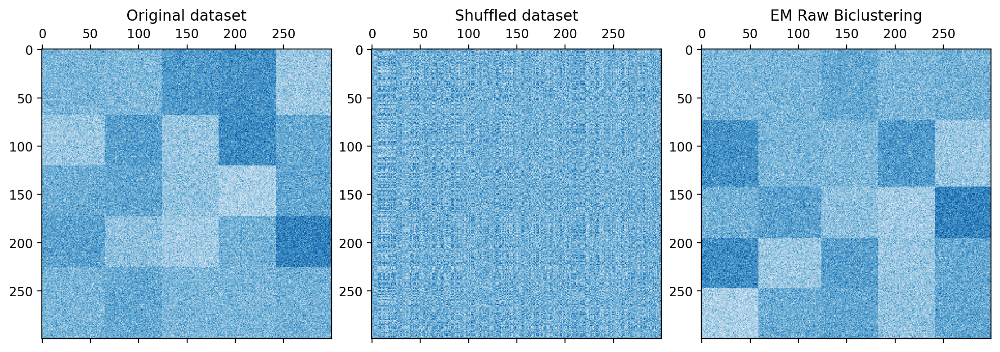

In [46]:
fig, (ax1, ax2, ax3) = plt.subplots(
    1, 3, figsize=(11, 4), layout='constrained', dpi=200)

shape = (300, 300)
n_clusters = 5
noise = 10
# type: Literal["biclusters", "checkerboard"] = "checkerboard"
metric: Literal['euclidian', 'kullback-leibler'] = "euclidian"
distribution: Literal['uniform', 'poissonian',
                      'gaussian', 'multinomial'] = 'poissonian'
algorithm_type: Literal['soft', 'raw'] = 'raw'
repeat = 20

if algorithm_type == "soft":
    algorithm = soft_EM
elif algorithm_type == "raw":
    algorithm = raw_EM

# generate data matrix with cluster assignments
data, rows, cols = make_checkerboard_with_custom_distribution(
    shape=shape, n_clusters=n_clusters, noise=noise, distribution=distribution)

# show original dataset with visible clusters
ax1.matshow(data, cmap=plt.cm.Blues)
ax1.set_title("Original dataset")

# shuffle data
rng = np.random.RandomState(0)
row_idx = rng.permutation(data.shape[0])
col_idx = rng.permutation(data.shape[1])
data = data[row_idx][:, col_idx]

# show shuffled data
ax2.matshow(data, cmap=plt.cm.Blues)
ax2.set_title("Shuffled dataset")

# calculate cluster assignments using an iterative algorithm
row_labels, col_labels = biclustering_wrapper(
    data, n_clusters, "checkerboard", metric, algorithm, repeat=repeat)

# reorder rows and cols of a data matrix to show clusters
fit_data = data[np.argsort(row_labels)]
fit_data = fit_data[:, np.argsort(col_labels)]

# show data matrix with reordered rows and cols according to calculated cluster assignments
ax3.matshow(fit_data, cmap=plt.cm.Blues)
ax3.set_title(f"EM {algorithm_type.capitalize()} Biclustering")

# calculate soncensus score between expected and actual biclusters
score = consensus_score(get_biclusters_from_labels(shape, n_clusters, row_labels, col_labels),
                        (rows[:, row_idx], cols[:, col_idx]))
score *= n_clusters

print(f"Consensus Score: {score:.3f}")

plt.show()


### Compare

In [84]:
def try_out_algorithm(
    distribution: Literal["poissonian", "gaussian", "multinomial", "uniform"],
    tests: int,
    *,
    shape = (50, 50),
    n_clusters = 5,
    noise = 5,
    repeat = 5
) -> pd.DataFrame:

    metrics = ["euclidian", "kullback-leibler"]
    algorithms = ["raw", "soft"]

    t = trange(tests, desc=f"{distribution.capitalize()}", leave=True)

    d = {
        "raw": {},
        "soft": {}
    }
    for algorithm in algorithms:
        for metric in metrics:
            d[algorithm][metric] = np.zeros(tests+1)

    for i in t:
        data, rows, cols = make_checkerboard_with_custom_distribution(shape, n_clusters, noise=noise, distribution=distribution)
        
        def run(metric: Literal["euclidian", "kullback-leibler"], algorithm: Literal["raw", "soft"]) -> float:
            if algorithm == "raw":
                em = raw_EM
            elif algorithm == "soft":
                em = soft_EM
            row_labels, col_labels = biclustering_wrapper(data, n_clusters, "checkerboard", metric, em, repeat=repeat, verbose=False)
            score = consensus_score(get_biclusters_from_labels(shape, n_clusters, row_labels, col_labels),
                                    (rows[:, row_idx], cols[:, col_idx]))
            return score * n_clusters

        rng = np.random.RandomState(0)
        row_idx = rng.permutation(data.shape[0])
        col_idx = rng.permutation(data.shape[1])
        data = data[row_idx][:, col_idx]

        for algorithm in algorithms:
            for metric in metrics:
                d[algorithm][metric][i+1] = run(metric, algorithm)

    res = {}

    for algorithm in algorithms:
        for metric in metrics:
            d[algorithm][metric][0] = np.mean(d[algorithm][metric][1:])
            metric_alias = ""
            if metric == "euclidian":
                metric_alias = "Euc"
            elif metric == "kullback-leibler":
                metric_alias = "KL"
            leave_3_digits  = np.vectorize(lambda x: f"{x:.3f}")
            res[f"({metric_alias}) {algorithm.capitalize()}"] = leave_3_digits(d[algorithm][metric])

    return pd.DataFrame(res, index=["Average"] + [f"Test {i+1}" for i in range(tests)]).T


In [107]:
tests = 50
df = try_out_algorithm("poissonian", tests, noise=10)
df

Poissonian: 100%|██████████| 50/50 [01:41<00:00,  2.04s/it]


,Average,Test 1,Test 2,Test 3,Test 4,Test 5,Test 6,Test 7,Test 8,Test 9,...,Test 41,Test 42,Test 43,Test 44,Test 45,Test 46,Test 47,Test 48,Test 49,Test 50
(Euc) Raw,0.788,1.000,0.730,0.876,0.698,1.000,1.000,0.960,0.624,0.847,...,0.965,1.000,0.516,0.517,0.558,1.000,0.761,0.935,1.000,0.745
(KL) Raw,0.786,1.000,0.760,0.776,0.363,0.883,0.720,0.706,0.584,0.673,...,0.874,1.000,0.454,0.779,0.695,1.000,0.649,0.651,1.000,0.870
(Euc) Soft,0.769,1.000,0.678,0.930,0.801,0.609,1.000,1.000,0.834,0.706,...,0.936,1.000,0.502,0.414,0.758,0.748,0.951,0.584,1.000,0.716
(KL) Soft,0.615,0.557,0.421,0.594,0.550,0.581,1.000,0.960,0.428,0.554,...,0.434,1.000,0.392,0.510,0.379,1.000,0.699,0.661,0.802,0.526


In [108]:
tests = 50
df = try_out_algorithm("gaussian", tests, noise=10)
df

Gaussian: 100%|██████████| 50/50 [00:56<00:00,  1.12s/it]


,Average,Test 1,Test 2,Test 3,Test 4,Test 5,Test 6,Test 7,Test 8,Test 9,...,Test 41,Test 42,Test 43,Test 44,Test 45,Test 46,Test 47,Test 48,Test 49,Test 50
(Euc) Raw,0.971,1.000,1.000,1.000,0.707,0.727,1.000,1.000,1.000,1.000,...,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.956,1.000
(KL) Raw,0.954,1.000,1.000,1.000,1.000,0.717,1.000,1.000,0.787,1.000,...,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.704,0.706,1.000
(Euc) Soft,0.814,1.000,1.000,0.710,0.747,1.000,0.705,0.729,0.647,1.000,...,1.000,0.513,1.000,1.000,1.000,0.743,0.729,1.000,0.706,1.000
(KL) Soft,0.834,1.000,0.706,1.000,1.000,0.967,1.000,1.000,0.787,1.000,...,1.000,0.747,1.000,1.000,0.718,0.714,1.000,0.733,0.706,1.000


In [109]:
tests = 50
df = try_out_algorithm("multinomial", tests, noise=10)
df

Multinomial: 100%|██████████| 50/50 [00:48<00:00,  1.04it/s]


,Average,Test 1,Test 2,Test 3,Test 4,Test 5,Test 6,Test 7,Test 8,Test 9,...,Test 41,Test 42,Test 43,Test 44,Test 45,Test 46,Test 47,Test 48,Test 49,Test 50
(Euc) Raw,0.972,1.000,0.708,1.000,1.000,1.000,1.000,1.000,1.000,1.000,...,1.000,1.000,1.000,0.706,1.000,1.000,1.000,1.000,1.000,1.000
(KL) Raw,0.942,0.737,1.000,1.000,1.000,0.700,1.000,1.000,1.000,1.000,...,1.000,1.000,1.000,0.706,1.000,0.707,1.000,1.000,1.000,1.000
(Euc) Soft,0.822,0.737,0.788,1.000,0.450,0.740,0.175,0.204,1.000,1.000,...,0.589,1.000,1.000,0.706,0.733,1.000,1.000,1.000,1.000,1.000
(KL) Soft,0.875,1.000,0.787,0.705,0.716,1.000,0.711,1.000,0.716,1.000,...,1.000,1.000,0.587,1.000,0.710,1.000,1.000,1.000,1.000,1.000


In [110]:
tests = 50
df = try_out_algorithm("uniform", tests, noise=10)
df

Uniform: 100%|██████████| 50/50 [00:58<00:00,  1.16s/it]


,Average,Test 1,Test 2,Test 3,Test 4,Test 5,Test 6,Test 7,Test 8,Test 9,...,Test 41,Test 42,Test 43,Test 44,Test 45,Test 46,Test 47,Test 48,Test 49,Test 50
(Euc) Raw,0.948,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,...,1.000,1.000,0.717,1.000,1.000,1.000,0.711,1.000,1.000,0.594
(KL) Raw,0.949,0.700,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,...,1.000,0.740,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
(Euc) Soft,0.820,0.700,1.000,0.500,1.000,0.712,0.712,1.000,1.000,1.000,...,0.714,0.736,0.717,0.530,1.000,1.000,0.711,0.710,0.733,0.706
(KL) Soft,0.858,1.000,1.000,1.000,1.000,0.712,1.000,1.000,1.000,1.000,...,0.711,1.000,0.517,1.000,0.517,0.139,0.449,1.000,0.594,1.000


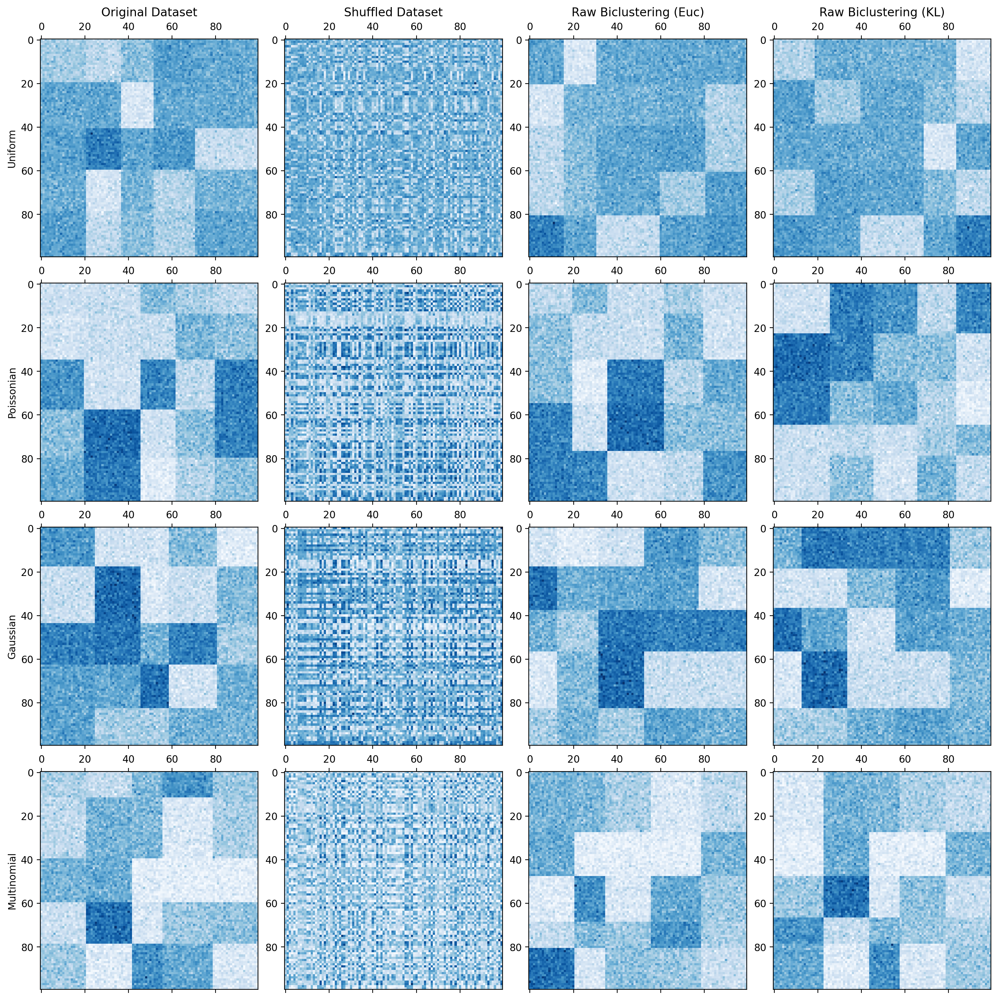

In [104]:
fig, axes = plt.subplots(4, 4, figsize=(14, 14), layout='constrained', dpi=200)

shape = (100, 100)
n_clusters = 5
noise = 10
distributions = ['uniform', 'poissonian', 'gaussian', 'multinomial']
repeat = 20

axes[0][0].set_title("Original Dataset")
axes[0][1].set_title("Shuffled Dataset")
axes[0][2].set_title("Raw Biclustering (Euc)")
axes[0][3].set_title("Raw Biclustering (KL)")
    

for distr_idx in range(len(distributions)):
  data, rows, cols = make_checkerboard_with_custom_distribution(
    shape=shape, n_clusters=n_clusters, noise=noise, distribution=distribution)
  axes[distr_idx][0].matshow(data, cmap=plt.cm.Blues)
  axes[distr_idx][0].set_ylabel(f"{distributions[distr_idx].capitalize()}")

  rng = np.random.RandomState(0)
  row_idx = rng.permutation(data.shape[0])
  col_idx = rng.permutation(data.shape[1])
  data = data[row_idx][:, col_idx]

  axes[distr_idx][1].matshow(data, cmap=plt.cm.Blues)

  euc_row_labels, euc_col_labels = biclustering_wrapper(data, n_clusters, "checkerboard", "euclidian", raw_EM, repeat=repeat, verbose=False)
  euc_data = data[np.argsort(euc_row_labels)]
  euc_data = euc_data[:, np.argsort(euc_col_labels)]
  axes[distr_idx][2].matshow(euc_data, cmap=plt.cm.Blues)

  kl_row_labels, kl_col_labels = biclustering_wrapper(data, n_clusters, "checkerboard", "kullback-leibler", raw_EM, repeat=repeat, verbose=False)
  kl_data = data[np.argsort(kl_row_labels)]
  kl_data = kl_data[:, np.argsort(kl_col_labels)]
  axes[distr_idx][3].matshow(kl_data, cmap=plt.cm.Blues)


plt.show()


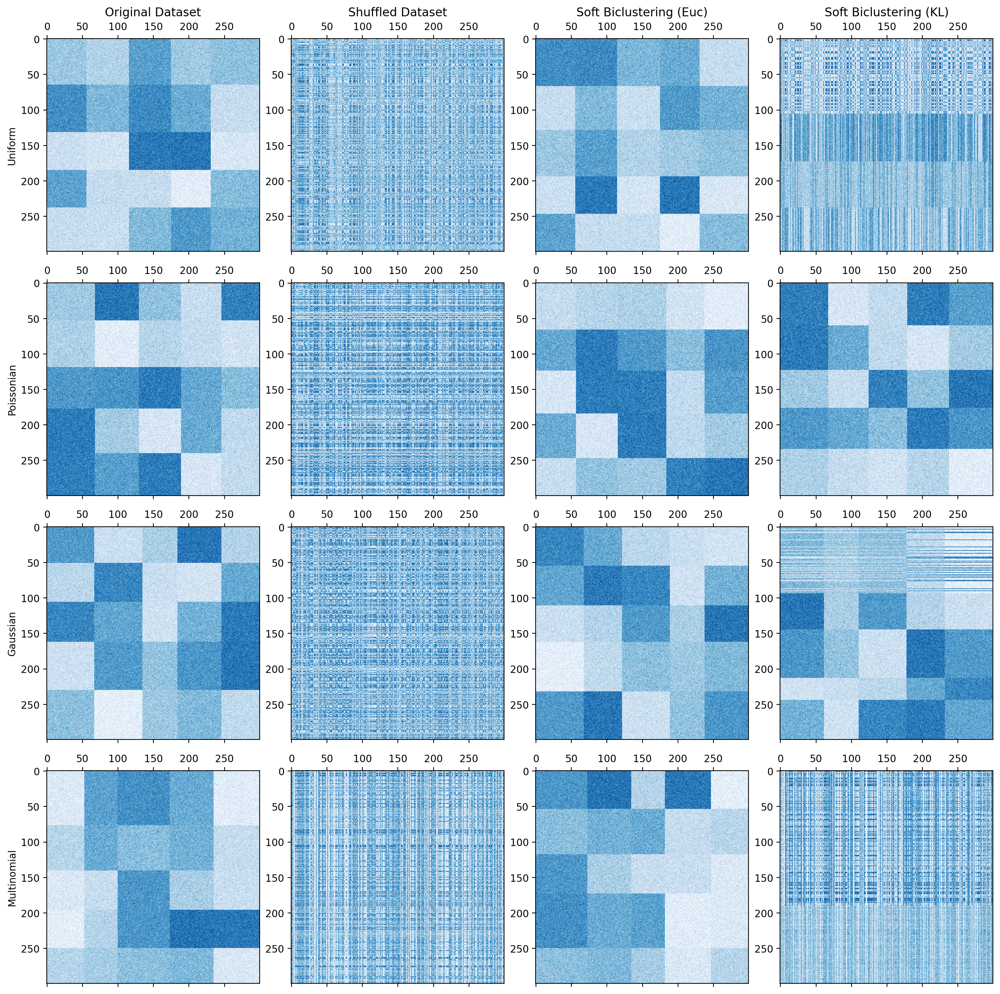

In [106]:
fig, axes = plt.subplots(4, 4, figsize=(14, 14), layout='constrained', dpi=200)

shape = (300, 300)
n_clusters = 5
noise = 10
distributions = ['uniform', 'poissonian', 'gaussian', 'multinomial']
repeat = 40

axes[0][0].set_title("Original Dataset")
axes[0][1].set_title("Shuffled Dataset")
axes[0][2].set_title("Soft Biclustering (Euc)")
axes[0][3].set_title("Soft Biclustering (KL)")
    

for distr_idx in range(len(distributions)):
  data, rows, cols = make_checkerboard_with_custom_distribution(
    shape=shape, n_clusters=n_clusters, noise=noise, distribution=distribution)
  axes[distr_idx][0].matshow(data, cmap=plt.cm.Blues)
  axes[distr_idx][0].set_ylabel(f"{distributions[distr_idx].capitalize()}")

  rng = np.random.RandomState(0)
  row_idx = rng.permutation(data.shape[0])
  col_idx = rng.permutation(data.shape[1])
  data = data[row_idx][:, col_idx]

  axes[distr_idx][1].matshow(data, cmap=plt.cm.Blues)

  euc_row_labels, euc_col_labels = biclustering_wrapper(data, n_clusters, "checkerboard", "euclidian", soft_EM, repeat=repeat, verbose=False)
  euc_data = data[np.argsort(euc_row_labels)]
  euc_data = euc_data[:, np.argsort(euc_col_labels)]
  axes[distr_idx][2].matshow(euc_data, cmap=plt.cm.Blues)

  kl_row_labels, kl_col_labels = biclustering_wrapper(data, n_clusters, "checkerboard", "kullback-leibler", soft_EM, repeat=repeat, verbose=False)
  kl_data = data[np.argsort(kl_row_labels)]
  kl_data = kl_data[:, np.argsort(kl_col_labels)]
  axes[distr_idx][3].matshow(kl_data, cmap=plt.cm.Blues)

plt.show()